# Lab 3 - CNN Visualization<br>
- Varun Singh<br>
4900 6872


# Model Selection

### In groups, you should select a convolutional neural network model that has been pre-trained on a large dataset (preferably, ImageNet). It is recommended to select a model with somewhat simple structure, like VGG. This can help to simplify how to extract specific filters and inputs to filters later on. 

For this lab I selected VGG19 convolutional neural network, which is a model pre trained on ImageNet. VGG stands for Visual Geometry Group. 

#### Explain the model you chose and why. 
VGG19 is an updated version of the VGG16 model. 19 is the number of convolutional layers in the model. 

I selected this model because it is a model trained on millions of images from ImageNet dataset, containing 1000 different classes. While the model performs well in classifying a wide range of classes, it still has a simple architecture. <br>

Because of the straight forward architecture, I feel I can pick a filter located somewhere downstream in the architecture, and  analyse, hypothesize and then verify the hypothesis about the function of the particular filter that I select, preferably in a downstream layer of the model architecture.    

### In groups, you should select a convolutional neural network model that has been pre-trained on a large dataset (preferably, ImageNet). It is recommended to select a model with somewhat simple structure, like VGG. This can help to simplify how to extract specific filters and inputs to filters later on. 

For this lab I selected VGG19 convolutional neural network, which is a model pre trained on ImageNet. VGG stands for Visual Geometry Group. 

#### Explain the model you chose and why. 
VGG19 is an updated version of the VGG16 model. 19 is the number of convolutional layers in the model. 

I selected this model because it is a model trained on millions of images from ImageNet dataset, containing 1000 different classes. While the model performs well in classifying a wide range of classes, it still has a somewhat simple architecture. <br>

Because of the straight forward architecture, I feel I can pick a filter located somewhere downstream in the architecture, and  analyse, hypothesize and then verify if the hypothesis is true about the function of a particular filter, in a downstream layer of the model architecture.    

When an image is passed through the model, we get a probability of the likelihood class of the subjects in the image. 

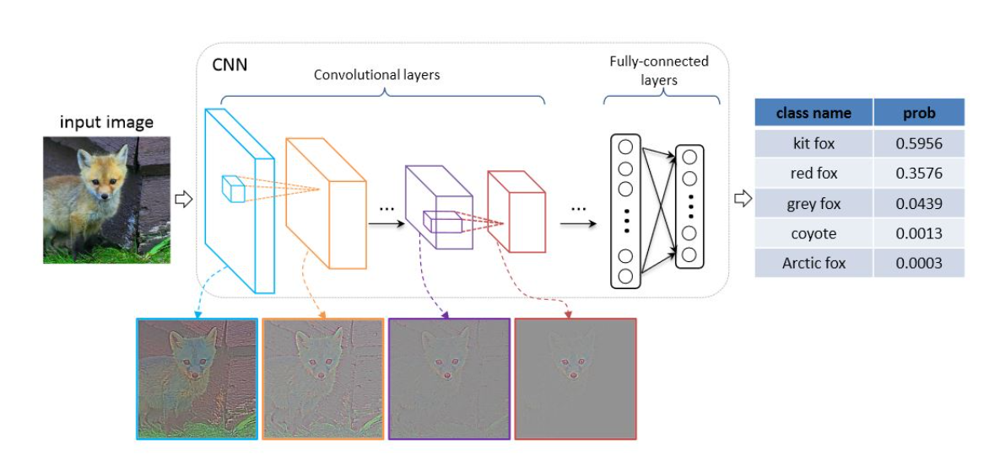

Image Source - https://viso.ai/deep-learning/vgg-very-deep-convolutional-networks/

The above image represents how a convolutional neural network works on a high level. When an image is fed to the input layer, each subsequent convolutional layer in the network is responsible for identifying different features or parts objects from the image. Each convolutional layer consists of multiple filters. A filter is a multi channel tensor that convolves over the input to generate activations, which are then pooled together after each block. Convolutional neural networks have filters instead of weights which retrieve valuable information from images to build the model. 

Each of these filters in a CNN, is responsible for detecting some object or shape or texture in an image. Convolutional layers which lie upstream, possess filters that are responsible for detecting major things in an image like edges of the objects, while downstream layers possess filters which are there to detect subtle features from the image.

#### We load the pretrained model first

In [1]:
from tensorflow.keras.applications import VGG19

def import_vgg19():
    # Load pre-trained VGG19 model
    model = VGG19(weights='imagenet', include_top=True)
    return model

model = import_vgg19()
print(model.summary())





Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0  

## Classify a few images with pre-trained network to verify that it is working properly.
Now, I passed some images, that I downloaded from https://www.pexels.com/, to verify if the model is working correctly on these test images. 


Image 1: 
1/1 [==============================] - 0s 252ms/step
Top Predictions:
1: soccer_ball (0.42)
2: ballplayer (0.37)
3: baseball (0.17)


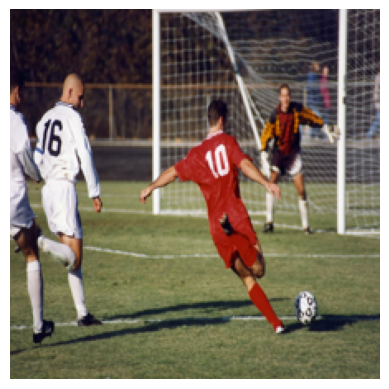

Image 2: 
1/1 [==============================] - 0s 96ms/step
Top Predictions:
1: mountain_bike (0.83)
2: bicycle-built-for-two (0.02)
3: alp (0.01)


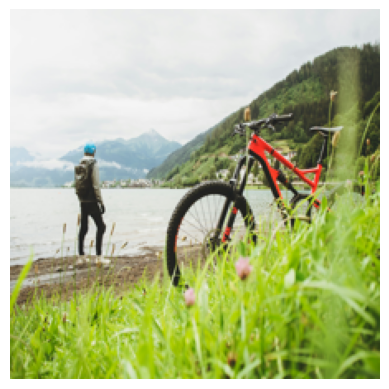

Image 3: 
1/1 [==============================] - 0s 96ms/step
Top Predictions:
1: soccer_ball (0.73)
2: football_helmet (0.23)
3: rugby_ball (0.02)


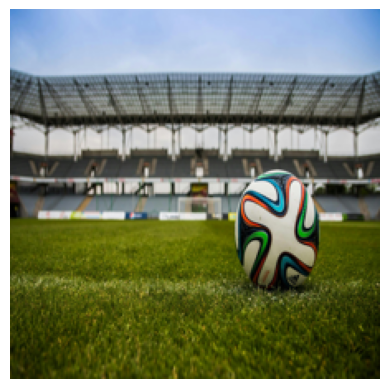

Image 4: 
1/1 [==============================] - 0s 111ms/step
Top Predictions:
1: scuba_diver (0.19)
2: snorkel (0.14)
3: tub (0.11)


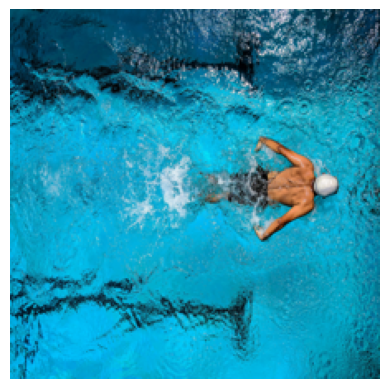

Image 5: 
1/1 [==============================] - 0s 101ms/step
Top Predictions:
1: bicycle-built-for-two (0.57)
2: mountain_bike (0.42)
3: crash_helmet (0.01)


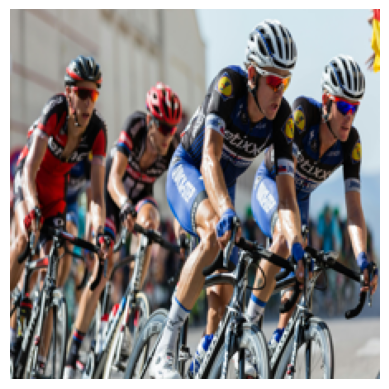

Image 6: 
1/1 [==============================] - 0s 94ms/step
Top Predictions:
1: football_helmet (1.00)
2: ballplayer (0.00)
3: soccer_ball (0.00)


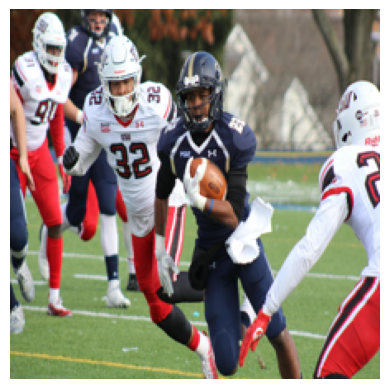

Image 7: 
1/1 [==============================] - 0s 94ms/step
Top Predictions:
1: racket (0.28)
2: wooden_spoon (0.15)
3: tennis_ball (0.13)


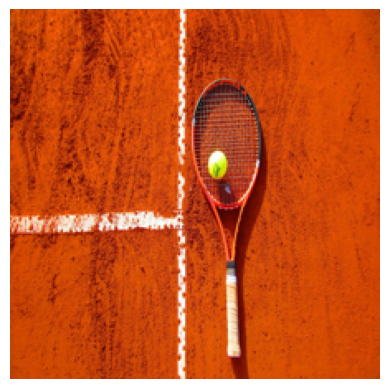

Image 8: 
1/1 [==============================] - 0s 108ms/step
Top Predictions:
1: basketball (0.49)
2: bikini (0.11)
3: balance_beam (0.08)


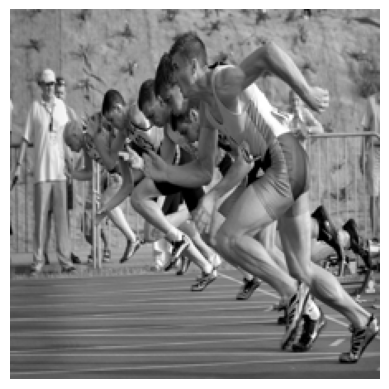

Image 9: 
1/1 [==============================] - 0s 101ms/step
Top Predictions:
1: ski (1.00)
2: alp (0.00)
3: snowmobile (0.00)


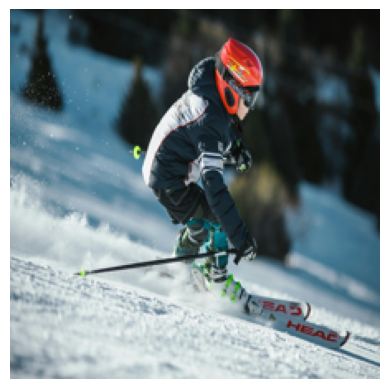

Image 10: 
1/1 [==============================] - 0s 102ms/step
Top Predictions:
1: puck (0.38)
2: unicycle (0.12)
3: knee_pad (0.11)


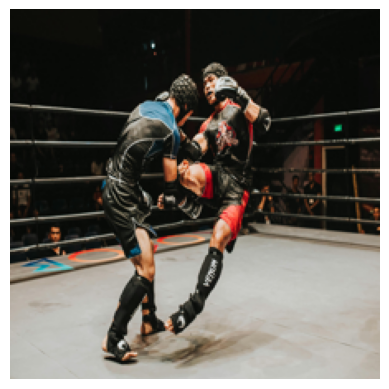

In [2]:

import os
import numpy as np
import requests
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions



# Function to preprocess the image and make predictions
def predict_image(img_path):
    # Load and preprocess the image
    img = Image.open(img_path)
    img = img.resize((224, 224))  # VGG19 input size
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Make predictions
    predictions = model.predict(img_array)
    decoded_predictions = decode_predictions(predictions, top=3)[0]

    # Print the top three predictions
    print("Top Predictions:")
    for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
        print(f"{i + 1}: {label} ({score:.2f})")

    # Display the image
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Path to the folder containing images
folder_path = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\images'

# Iterate over the images in the folder
for i, filename in enumerate(os.listdir(folder_path), start=1):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        print(f"Image {i}: ")
        img_path = os.path.join(folder_path, filename)
        predict_image(img_path)


In the above output, we see that the VGG19 model does a good job of identifying different kinds of objects in the images that we passed through it. 

# Filter Selection - Filter 457 from Block5_Conv1

I looked at different layers and experimented with different layers in Blocks 4 and 5, and finally decided to select Filter 457, from the Block 5_Conv 1 layer of the VGG model. I made use of visualizations from https://microscope.openai.com/models/Links to make this selection. 

The block 5 conv1 layer lies downstream, so we know it will be focused on identifying subtle features/characteristics in the images, unlike what we might find in the upstream convolutional layers. 


#### Using image gradient techniques, find an input image that maximally excites this chosen multi-channel filter. 
The firs task in this lab, In the below code, I use gradient ascent technique, to create an image which maximally excites the filter 457 from Block 5 Conv 1. 

Layer: block5_conv1, Filter number 457


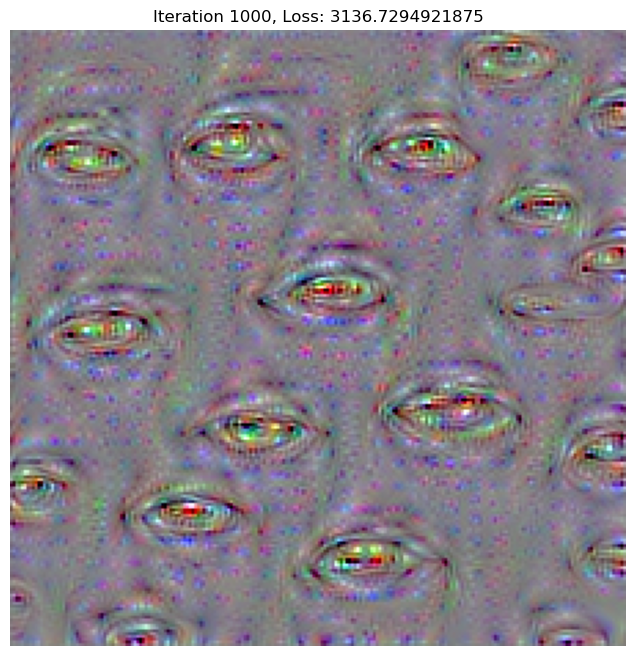

In [57]:
import tensorflow as tf
from tensorflow.keras import models
import numpy as np
import matplotlib.pyplot as plt

# Selecting a layer and channel to visualize
layer_name = ['block5_conv1']

for current_layer in range(len(layer_name)):
    # Isolate the output of interest and create a new model
    layer_output = model.get_layer(layer_name[current_layer]).output
    new_model = models.Model(inputs=model.input, outputs=layer_output)
    
    layer_output = model.get_layer(block5_conv1).output
    
    
    # Select the filter
    filter_index = 457

    # Define a function to compute the loss
    def compute_loss(input_image, filter_index):
        activation = new_model(input_image)
        return tf.reduce_mean(activation[:, :, :, filter_index])

    # Define a function to perform gradient ascent
    @tf.function
    def gradient_ascent_step(input_image, filter_index, learning_rate=0.01):
        with tf.GradientTape() as tape:
            tape.watch(input_image)
            loss = compute_loss(input_image, filter_index)
        grads = tape.gradient(loss, input_image)
        grads /= tf.maximum(tf.math.reduce_std(grads), 1e-8)
        input_image += learning_rate * grads
        return input_image, loss

    # Initialize an input image
    input_image = tf.random.uniform((1, 224, 224, 3))

    print(f"Layer: {layer_name[current_layer]}, Filter number {filter_index}")

    # Run gradient ascent for a number of iterations
    iterations = [1000]
    for j in iterations:
        for i in range(j):
            input_image, loss = gradient_ascent_step(input_image, filter_index)

# Convert the resulting image to a numpy array
generated_image = input_image.numpy().squeeze()
# Normalize the image for visualization
generated_image -= generated_image.mean()
generated_image /= generated_image.std() + 1e-5
generated_image *= 0.1
generated_image += 0.5
generated_image = np.clip(generated_image, 0, 1)
# Display the generated image
plt.figure(figsize=(8, 8))
plt.imshow(generated_image, cmap='viridis')
plt.axis('off')
plt.title(f"Iteration {i+1}, Loss: {loss.numpy()}")
plt.show()


In the above generated image, we see a concave structure, similar to eyes or lips of a person.



## Also send images of varying class (i.e., from ImageNet) through the network and track which classes of images most excite your chosen filter. 

Now, next step is to pass images 2,3 images from each of the 1000 classes of ImageNet. For this task I downloaded a datset from this source - https://www.kaggle.com/datasets/deeptrial/miniimagenet?resource=download. This dataset is a mini version of ImageNet, it contains 2-5 images from each class in ImageNet.  

By doing this, we aim to identify which classes are most influenced by the filter 457 of block5_conv1 layer.  

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.preprocessing import image
import json
import sys


# Path to the directory containing the images
images_dir = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\imagenet\images'

# Load ImageNet class index
imagenet_class_index_path = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\imagenet\imagenet_class_index.json'
with open(imagenet_class_index_path) as f:
    class_index = json.load(f)


# Define a new model that outputs activations of the desired layer
activation_model = tf.keras.Model(inputs=model.input, outputs=block5_conv1_layer.output)

# Iterate over each directory (class label) in the images directory
for class_label in os.listdir(images_dir):
    class_dir = os.path.join(images_dir, class_label)
    if not os.path.isdir(class_dir):
        continue
    
    # List to store activations for this class
    class_activations = []
    
    # Iterate over each image in the class directory
    for filename in os.listdir(class_dir):
        try:
            img_path = os.path.join(class_dir, filename)
            img = image.load_img(img_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)

            # Get activations from block5_conv1 layer
            activations = activation_model.predict(x)
            
            # While identifying the image class that activated the chosen filter the most, 
            # I took average of activation of each image class          
            
            # Append activations from filter 457
            class_activations.append(activations[..., 457])
        except Exception as e:
            pass
    
    # Compute average activation for this class
    avg_activation = np.mean(class_activations)
    class_activations_dict[class_label] = avg_activation

# And now, I sorted the class_activation_dict that I created to store the activations for all the images
# that I passed through the pre trained VGG19 model   

# Select top 5 classes with highest average activation
top_classes = sorted(class_activations_dict, key=class_activations_dict.get, reverse=True)[:5]





From above code, we identified and stored the top 5 classes which excited the filter the most. And now we print 2 images from each of the 5 classes below.


In [29]:
images_dir = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\imagenet\images'

# This was just some code to debug by printing the path to images that activated the 
# Block5, Conv1 filter - 457 the most

combined_paths = []
for name in top_classes:
    combined_paths.append(os.path.join(images_dir, name))

print(combined_paths)


['C:\\Users\\varun\\OneDrive\\Desktop\\Assignment\\8321\\Lab 3\\imagenet\\images\\n03657121', 'C:\\Users\\varun\\OneDrive\\Desktop\\Assignment\\8321\\Lab 3\\imagenet\\images\\n04357314', 'C:\\Users\\varun\\OneDrive\\Desktop\\Assignment\\8321\\Lab 3\\imagenet\\images\\n02808304', 'C:\\Users\\varun\\OneDrive\\Desktop\\Assignment\\8321\\Lab 3\\imagenet\\images\\n03787032', 'C:\\Users\\varun\\OneDrive\\Desktop\\Assignment\\8321\\Lab 3\\imagenet\\images\\n04162706']



Class Name: lens_cap

Class ID: n03657121


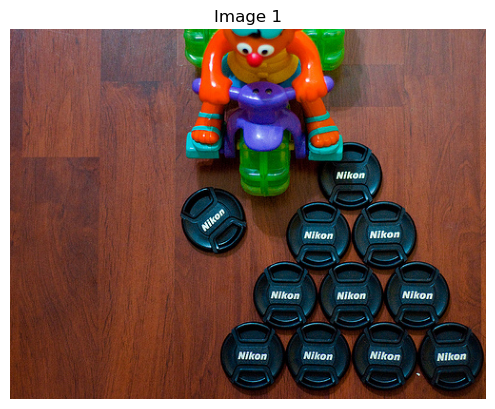

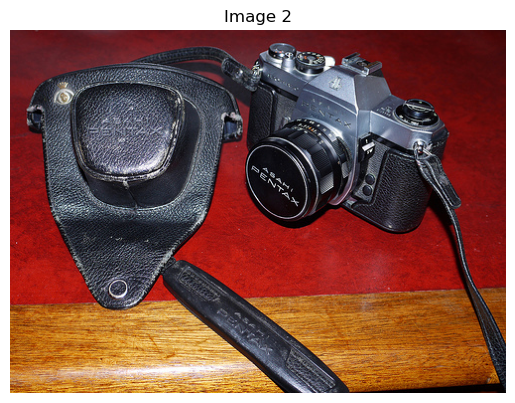


Class Name: sunscreen

Class ID: n04357314


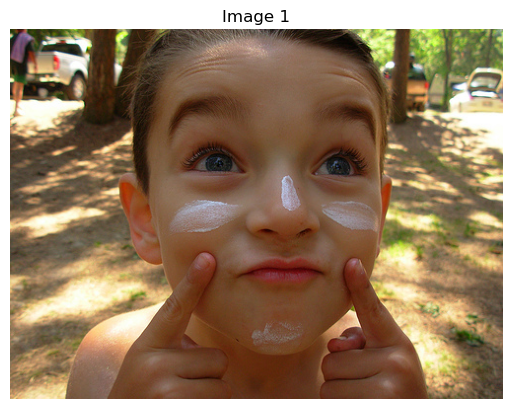

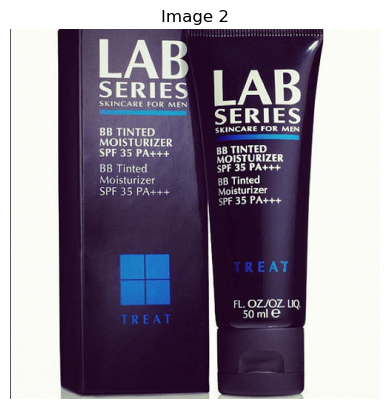


Class Name: bath_towel

Class ID: n02808304


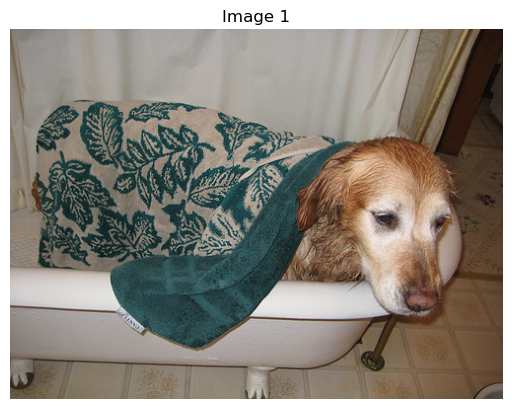

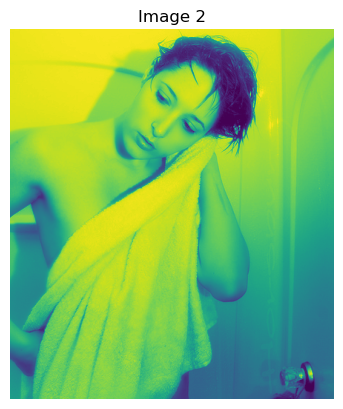


Class Name: mortarboard

Class ID: n03787032


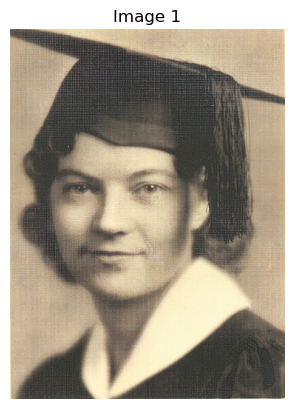

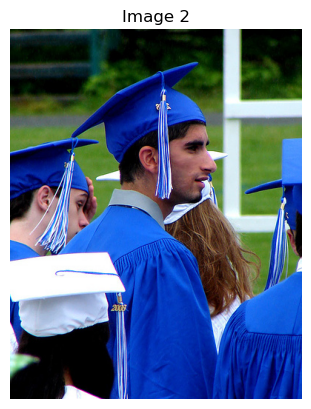


Class Name: seat_belt

Class ID: n04162706


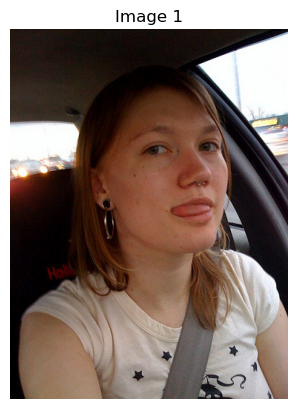

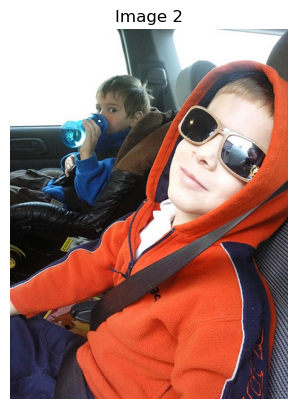

In [30]:
import os
import json
import matplotlib.pyplot as plt

json_path = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\imagenet\imagenet_class_index.json'

# Load the JSON file into a dictionary, this json contains the class name, the dataset that I selected to train
# above model was a mini version of ImageNet that I downloaded from Kaggle(link the references)

with open(json_path) as f:
    class_index = json.load(f)
    
# the names of all the directories didn't make any sense so getting equivalent class names to print for the top classes.

# Function to get class name from directory name
def get_class_name(identifier):
    for key, value in class_index.items():
        if value[0] == identifier:
            return value[1]
    return 'Unknown'

# Loop through combined paths
for path in combined_paths:
    class_id = os.path.basename(path)  # Extract class ID from the directory name
    
    class_name = get_class_name(class_id)  # Get class name from the JSON file
    print(f"\nClass Name: {class_name}")
    print(f"\nClass ID: {class_id}")
    
    # List images in the directory
    images = os.listdir(path)
    
    # number of images for each class in this dataset were in the range (2,5),
    # this is the reason that I chose highest average activation over taking the total sum of activation 
    # while chosing the image class,
    # so limiting to 2 images for the top classes.
    
    for idx, image_file in enumerate(images[:2]):  # Limit to 2 images per class
        image_path = os.path.join(path, image_file)
        img = plt.imread(image_path)
        
        # Display the image
        plt.imshow(img)
        plt.title(f"Image {idx+1}")
        plt.axis('off')
        plt.show()


From the above output of different image classes, we see a common theme, a lot of concave shaped images. A lot of images of people, with their lips and eyes clearly visible. Even in the case of 'lens_shape' class, I feel the filter was excited becasue of the presence of concave shaped lens cover

#### Hypothesis - Give a hypothesis for what this multi-channel filter might be extracting. That is, what do you think its function is in the network? Give reasoning for your hypothesis. 

I believe the function of this filter is to detect concave shapes, like lips or eyes, if we look at the image we created using gradient ascent to maximally excite the filter, then this hypothesis makes even more sense. Because by looking closely at it, I see a facial structure with eyes and lips.  

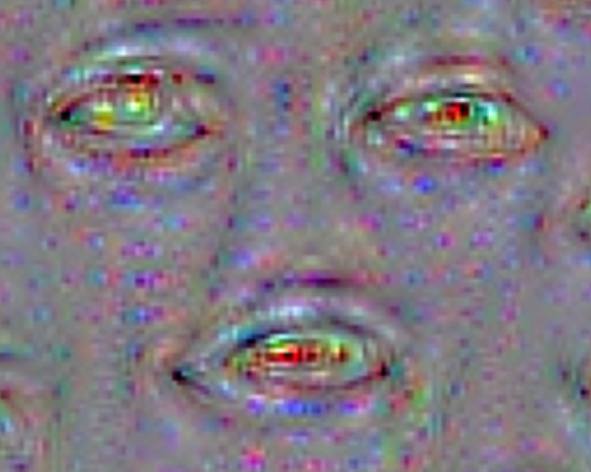

P.S. - Sorry for the jump scare &#128514;

## Analyze each channel of the multi-channel filter to better understand how this might form a circuit. 

Now, I want to look at the filter coefficients of each channel of the multi channel filter 457 in Block5_Conv1 layer of VGG19. By doing this I aim to identify the most influential filters in this multi channel filter. 

To do this, I extracted the input weights of each channel in the filter 457. There are a total of 512 channels in this particular filter. I sorted the channels based on the L2 normalisation. I used a random sample image to extract filter channels which were the most excited. I want the channels to not be based on any image that I can think of, this way I don't want myself to be biased towards my hypothesis about the function of this filter in the local circuit of the neural network.  

First I extracted the filter coefficients for each input activation to that multi-channel filter. Then I calculate the L2 normalization to identify the top 10 influential channels. By using L2 normalization function, we calculate the square root of sum of squares of each vector component. This way we can identify all channels, excitory and inhibitory, because the squares ensure inclusivity of negative filter weights as well. 

After we identify the channels, I print the list of the top 10 most influential channels and then we use these channels later on for more analysis of this filter 457, in Block5_Conv1 of the VGG19.




In [ ]:
import numpy as np
from tensorflow.keras.applications import VGG19

# Load the VGG19 model
model = VGG19(weights='imagenet', include_top=False)

# Define a function to extract filter coefficients
def extract_filter_coefficients(activations, filter_idx):
    return activations[..., filter_idx]

# Define a function to calculate L2 norm for each filter
def calculate_l2_norm(filters):
    filters_reshaped = filters.reshape(-1, filters.shape[-1])  # Reshape to 2D array
    l2_norms = np.linalg.norm(filters_reshaped, axis=0)
    return l2_norms

# Define a function to rank filters based on L2 norm
def rank_influential_filters(activations, num_filters=10):
    filter_norms = calculate_l2_norm(activations)
    top_filter_indices = np.argsort(filter_norms)[-num_filters:][::-1]
    return top_filter_indices

# Define a function to categorize filters as mostly excitatory or inhibitory
def categorize_filters(activations, top_filter_indices):
    excitatory_filters = []
    
    for idx in top_filter_indices:
        filter_weights = extract_filter_coefficients(activations, idx)
        if np.mean(filter_weights) > 0:
            excitatory_filters.append(idx)
        
    return excitatory_filters

# Load and preprocess an example image
example_image = np.random.rand(1, 224, 224, 3)  # Example random image

# Extract activations for the example image
activations = model.predict(example_image)

# Rank the most influential filters based on L2 norm
top_filter_indices = rank_influential_filters(activations)

# Categorize filters as mostly excitatory or inhibitory
excitatory_filters = categorize_filters(activations, top_filter_indices)

# Print the results
print("Mostly influential channels:", excitatory_filters)


In [36]:
import numpy as np
import os
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Load the VGG19 model
model = VGG19(weights='imagenet', include_top=False)

# Define a function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    
    # Display the image
    print_image(image_path)
    
    return img_array

In [37]:
# Function to print imaages
from PIL import Image
from tensorflow.keras.applications.vgg19 import preprocess_input

def print_image(image_path):
    # Load and preprocess the image
    img = Image.open(image_path)
    img = img.resize((224, 224))  # VGG19 input size
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Display the image
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Define a function to extract activations from block 5 conv1
def get_block5_conv1_activations(image_path):
    img = load_and_preprocess_image(image_path)
    activations_model = Model(inputs=model.input, outputs=model.get_layer('block5_conv1').output)
    activations = activations_model.predict(img)
    return activations

# Define a function to extract filter coefficients
def extract_filter_coefficients(activations, filter_idx):
    return activations[..., filter_idx]

The below function is used to display the visuals of the top 10 most influential channels and the output activations produced when we pass some test images through it to visualize the areas influenced by single channel filters. 

In [38]:
# Define a function to visualize activations and channel weights
def visualize_activations_and_weights(activations, target_filter_indices):
    num_filters = len(target_filter_indices)
    num_cols = 5
    num_rows = 4  # Four rows: 2 for activations and 2 for channel weights
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, idx in enumerate(target_filter_indices):
        # Calculate row and column indices
        row_activation = i // num_cols
        col_activation = i % num_cols

        # Visualize activation image
        activation_image = activations[..., idx].squeeze()
        im_activation = axes[row_activation * 2, col_activation].imshow(activation_image, cmap='viridis')
        axes[row_activation * 2, col_activation].set_title(f'Activation {idx}')
        axes[row_activation * 2, col_activation].axis('off')
        fig.colorbar(im_activation, ax=axes[row_activation * 2, col_activation], fraction=0.046, pad=0.04)

        # Visualize corresponding channel weights
        filter_weights = model.get_layer('block5_conv1').get_weights()[0][:, :, :, idx]
        channel_weights = filter_weights[..., 0]
        im_weights = axes[row_activation * 2 + 1, col_activation].imshow(channel_weights, cmap='viridis')
        axes[row_activation * 2 + 1, col_activation].set_title(f'Channel {idx} weights')
        axes[row_activation * 2 + 1, col_activation].axis('off')
        fig.colorbar(im_weights, ax=axes[row_activation * 2 + 1, col_activation], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

Now using the below code, we calculate activations for each channel, that we identified earlier as being most influential in this filter, for some test images to check if the feature identified by this filter is 

Image 1: 


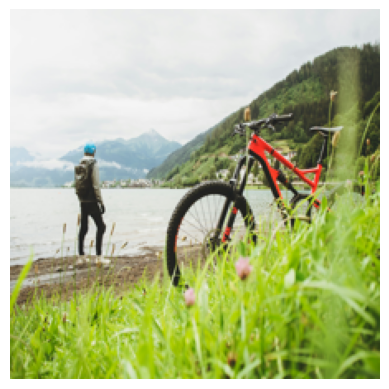

1/1 [==============================] - 0s 165ms/step


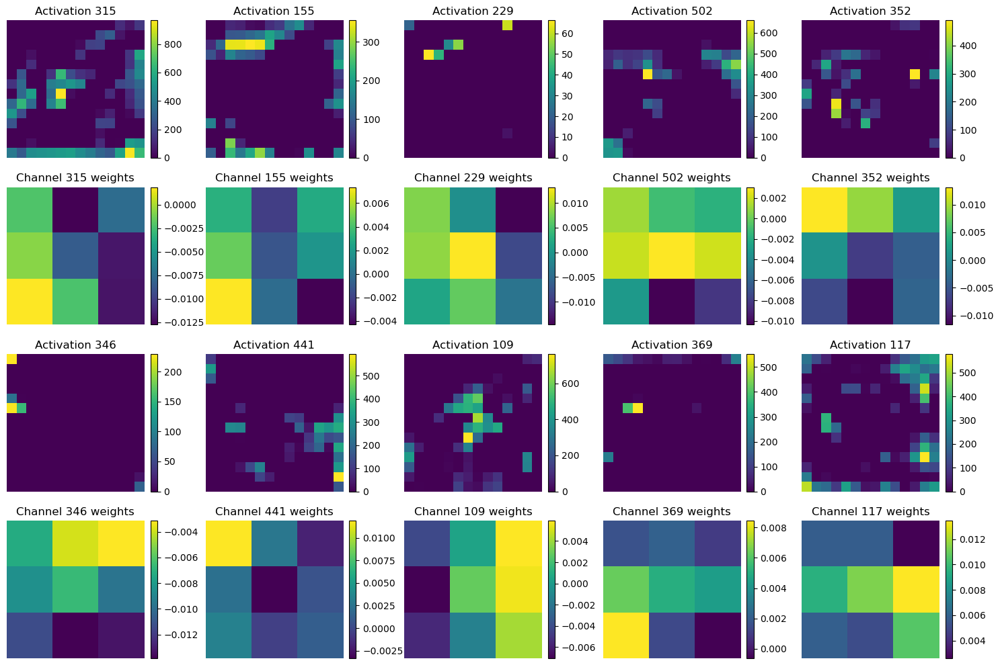

Image 2: 


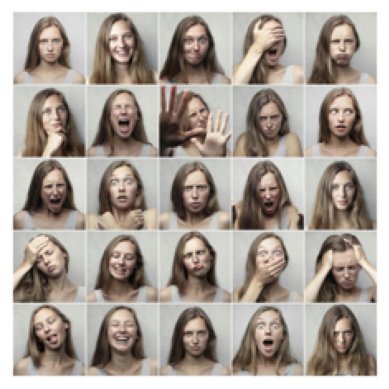

1/1 [==============================] - 0s 173ms/step


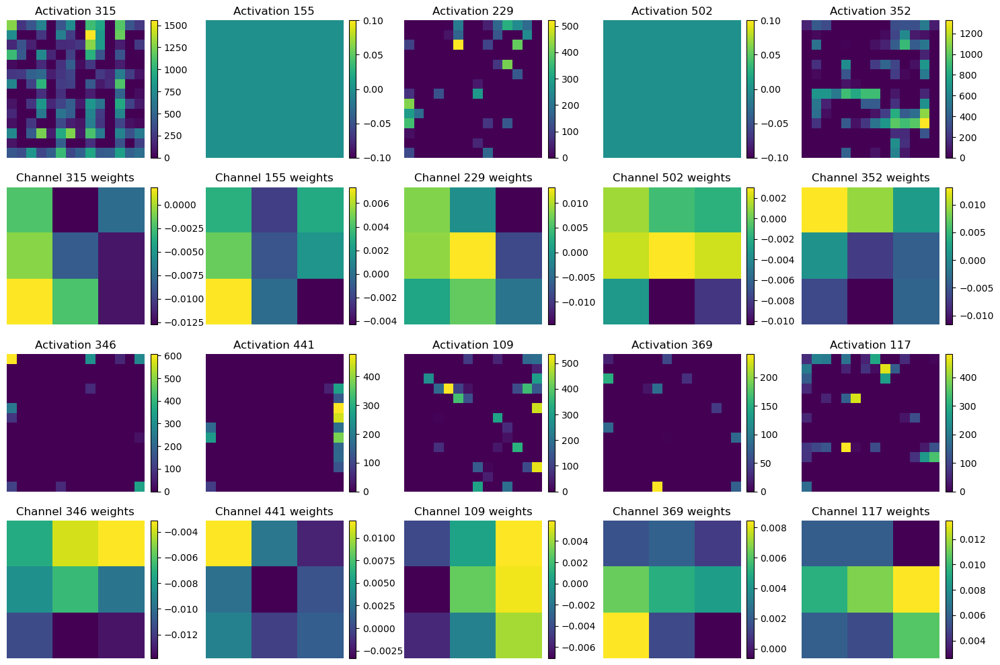

Image 3: 


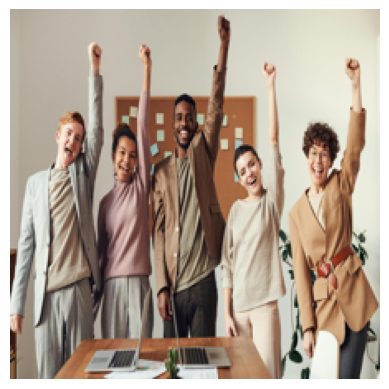

1/1 [==============================] - 0s 229ms/step


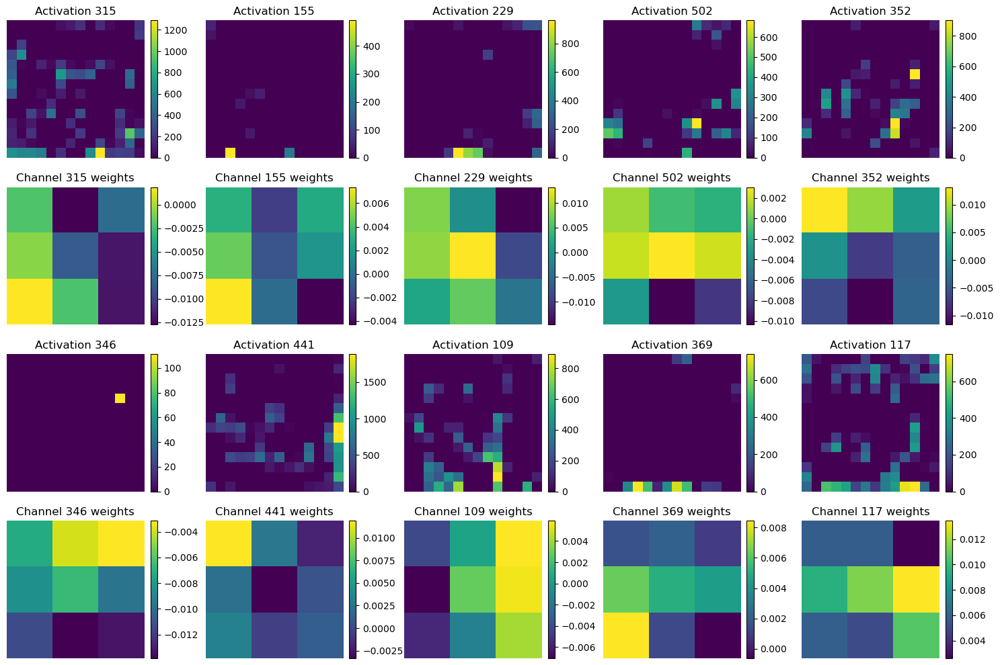

Image 4: 


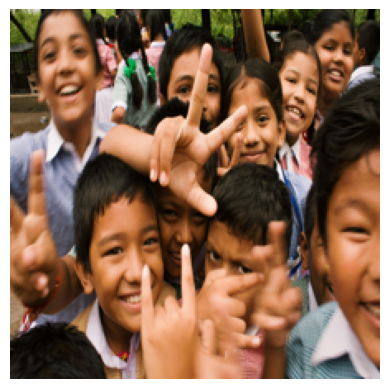

1/1 [==============================] - 0s 220ms/step


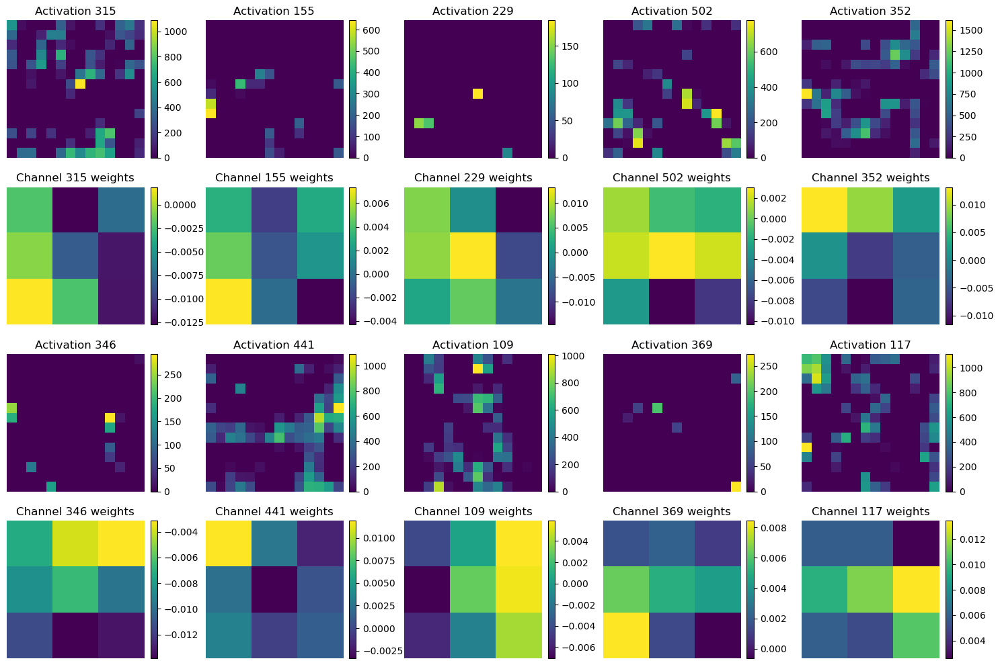

Image 5: 


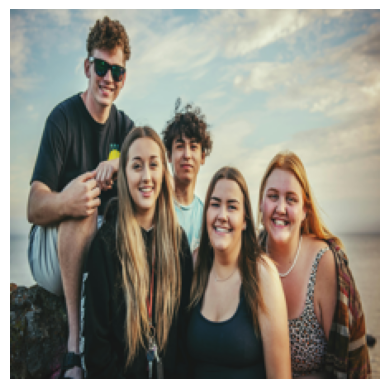

1/1 [==============================] - 0s 211ms/step


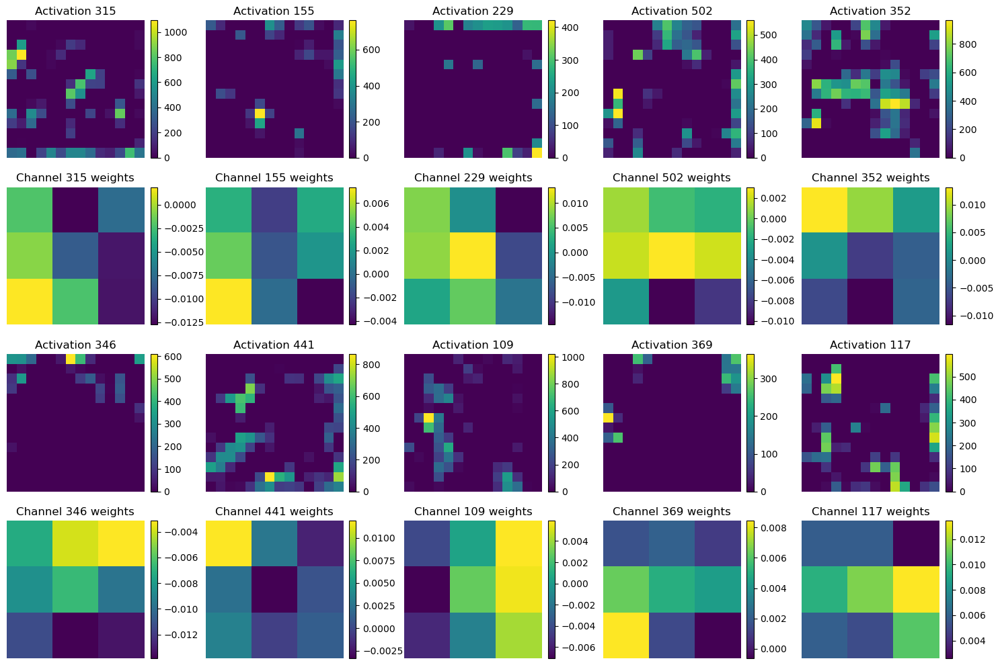

Image 6: 


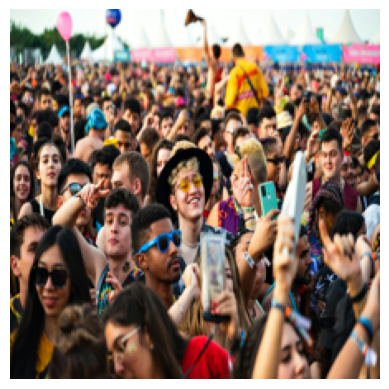

1/1 [==============================] - 0s 190ms/step


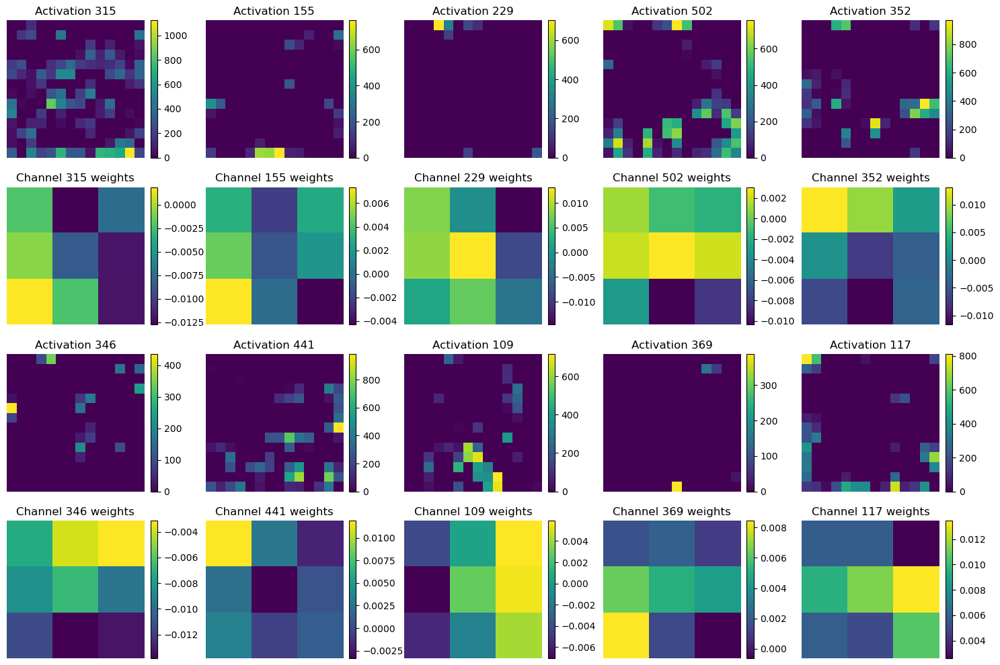

Image 7: 


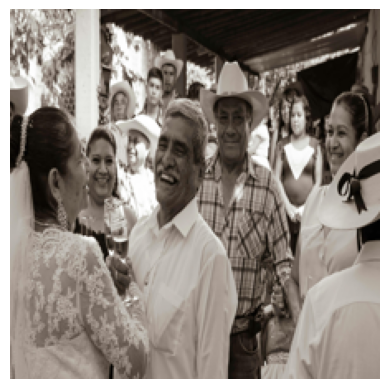

1/1 [==============================] - 0s 163ms/step


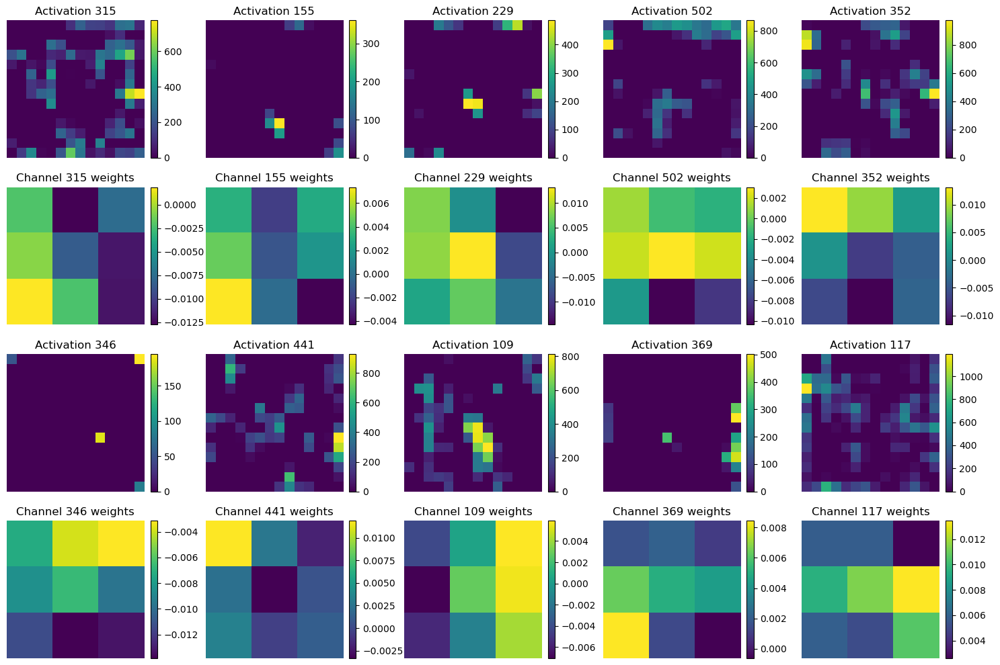

Image 8: 


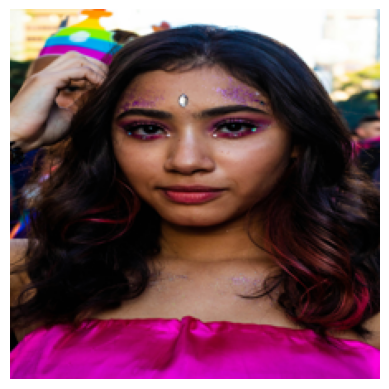

1/1 [==============================] - 0s 203ms/step


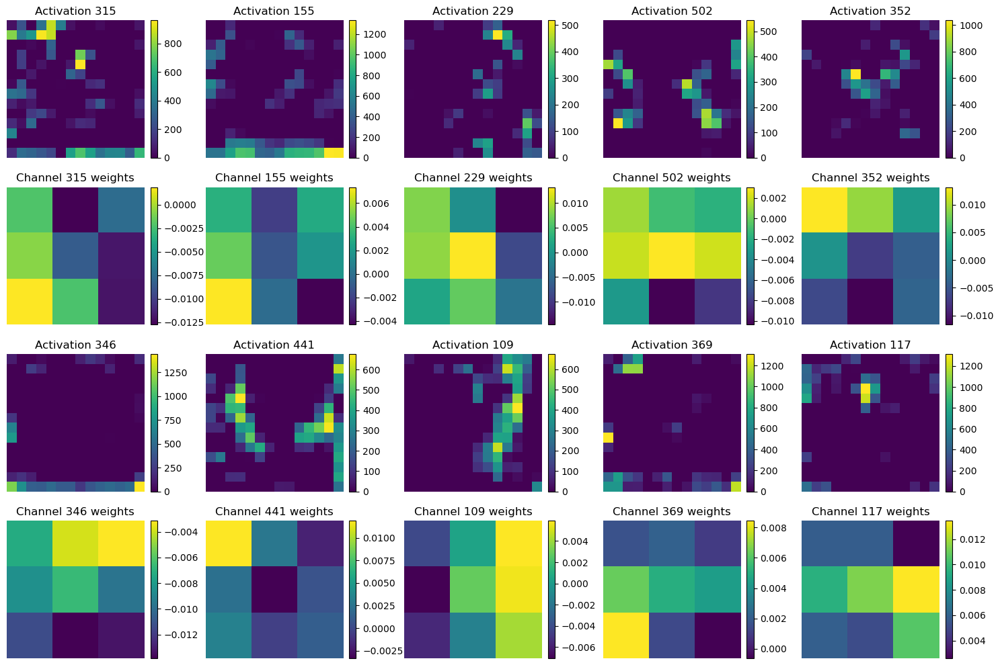

Image 9: 


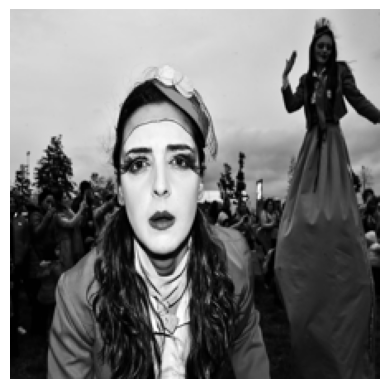

1/1 [==============================] - 0s 193ms/step


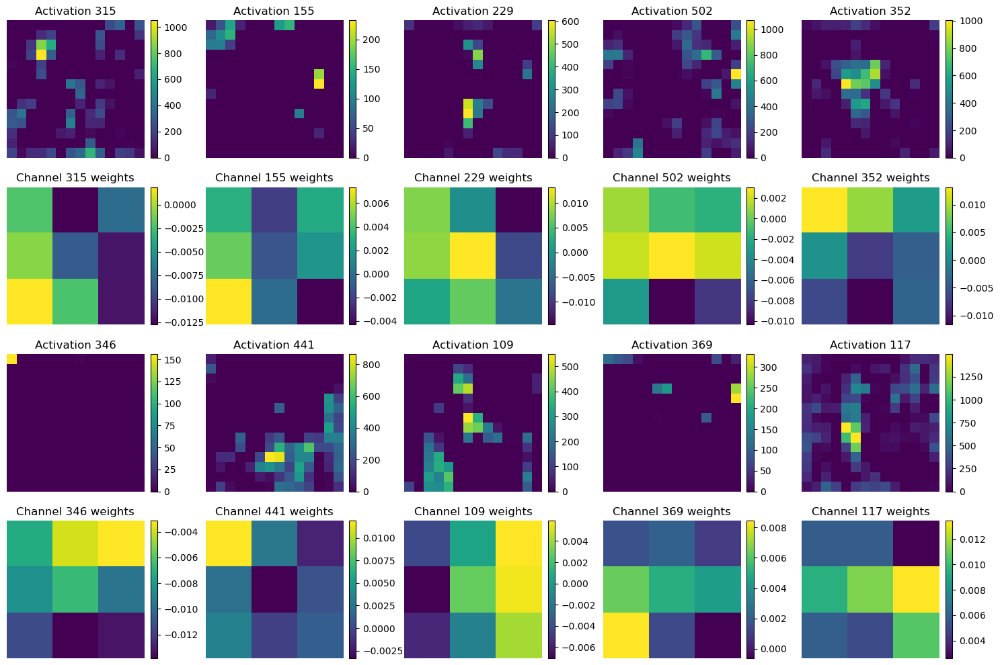

Image 10: 


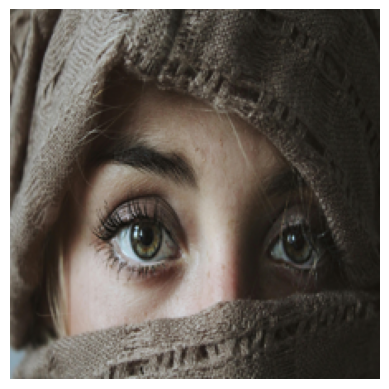

1/1 [==============================] - 0s 189ms/step


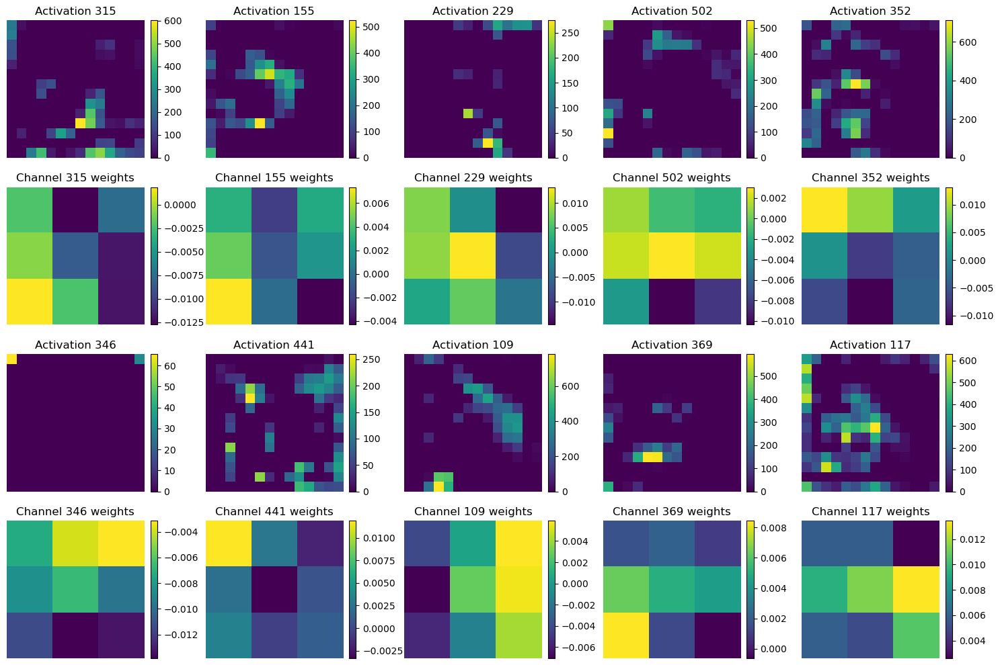

Image 11: 


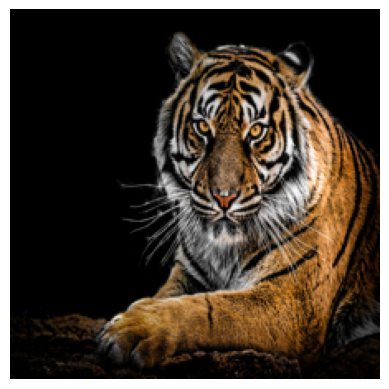

1/1 [==============================] - 0s 208ms/step


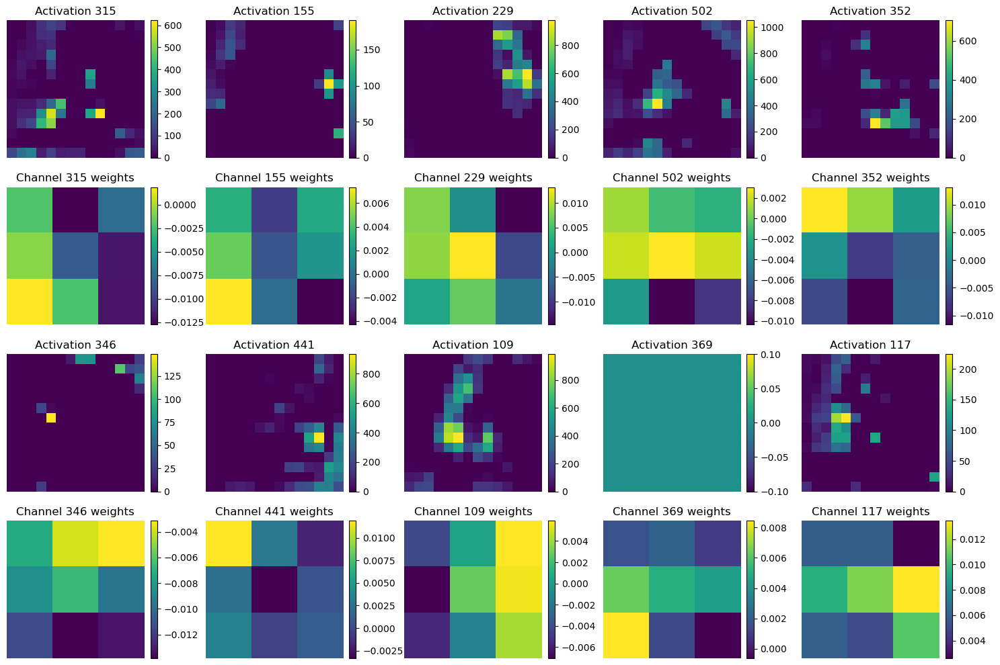

Image 12: 


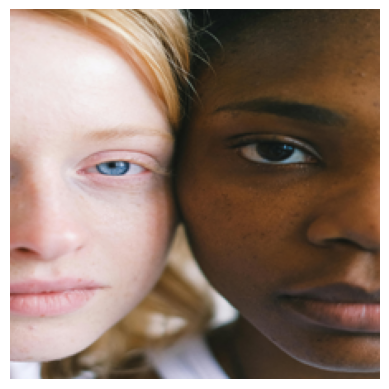

1/1 [==============================] - 0s 212ms/step


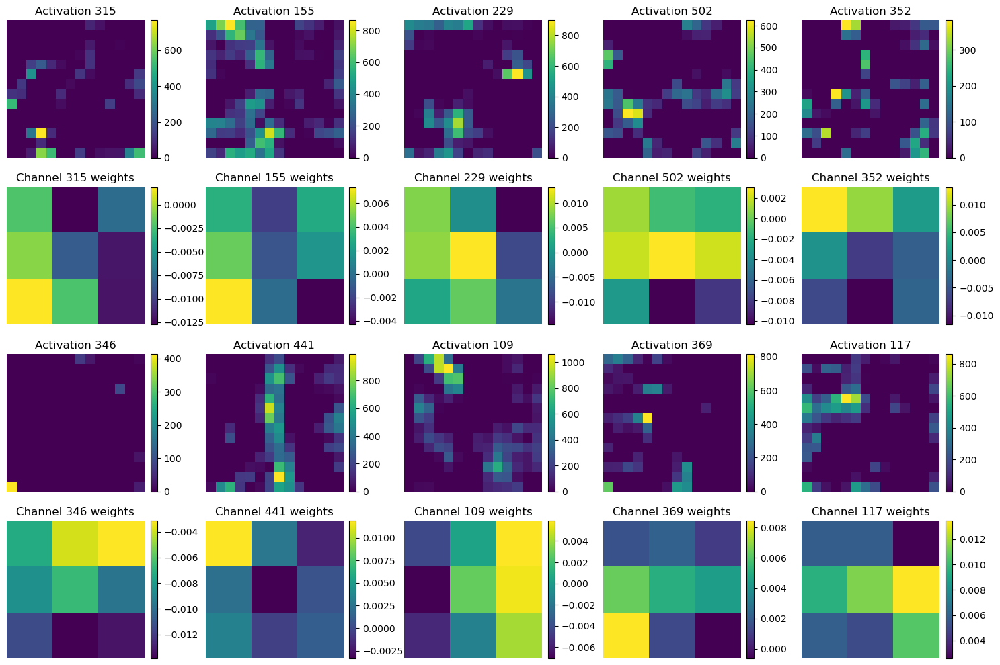

Image 13: 


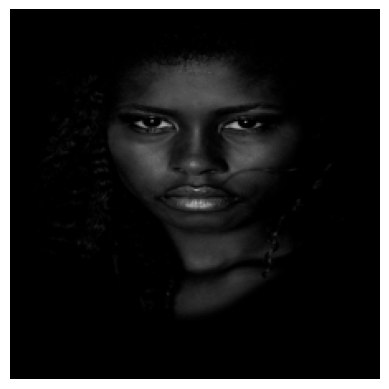

1/1 [==============================] - 0s 204ms/step


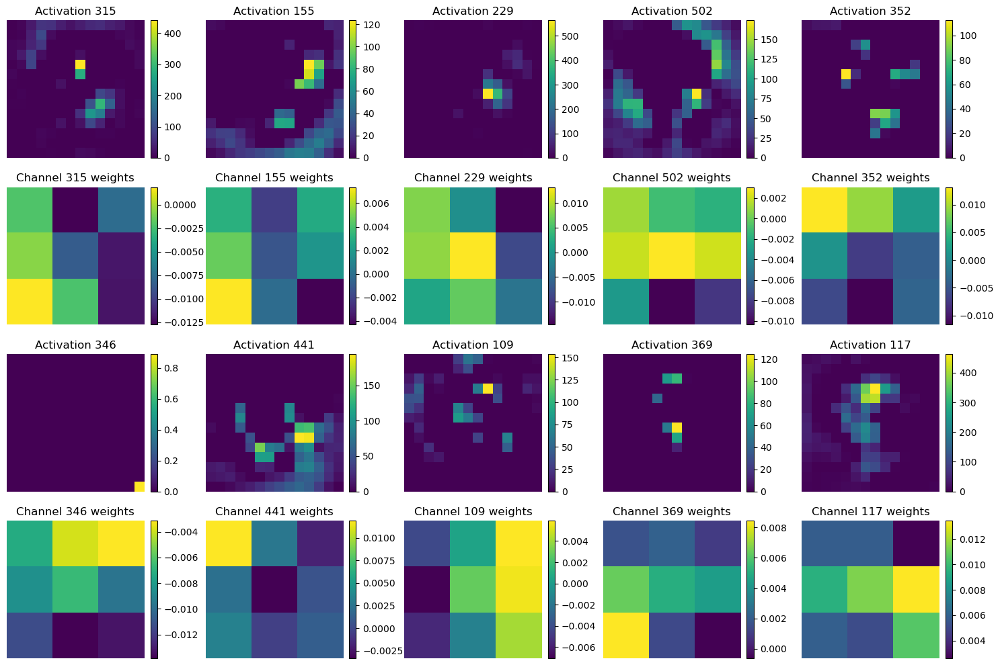

Image 14: 


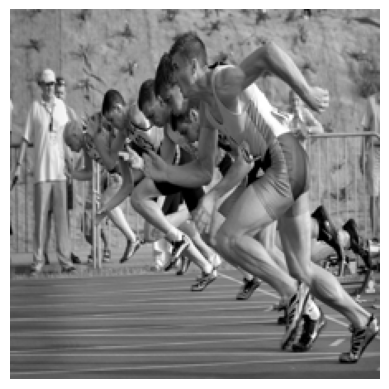

1/1 [==============================] - 0s 216ms/step


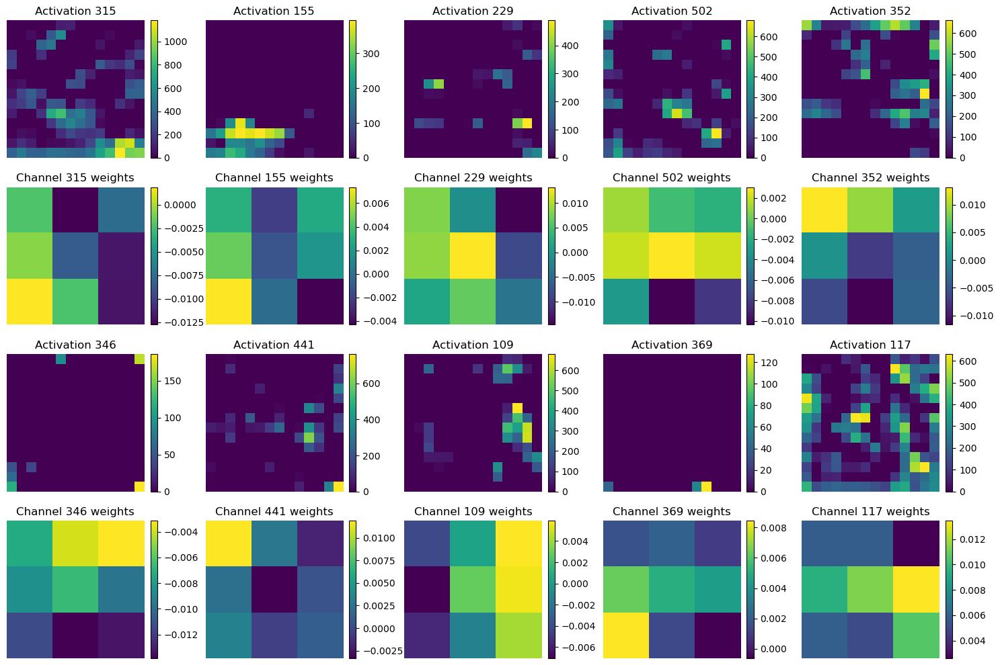

Image 15: 


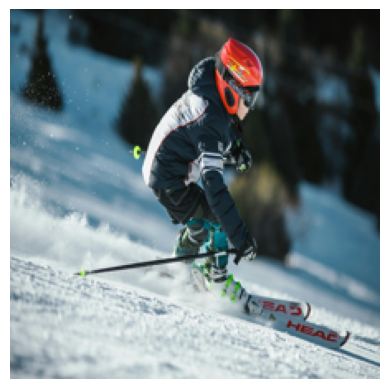

1/1 [==============================] - 0s 214ms/step


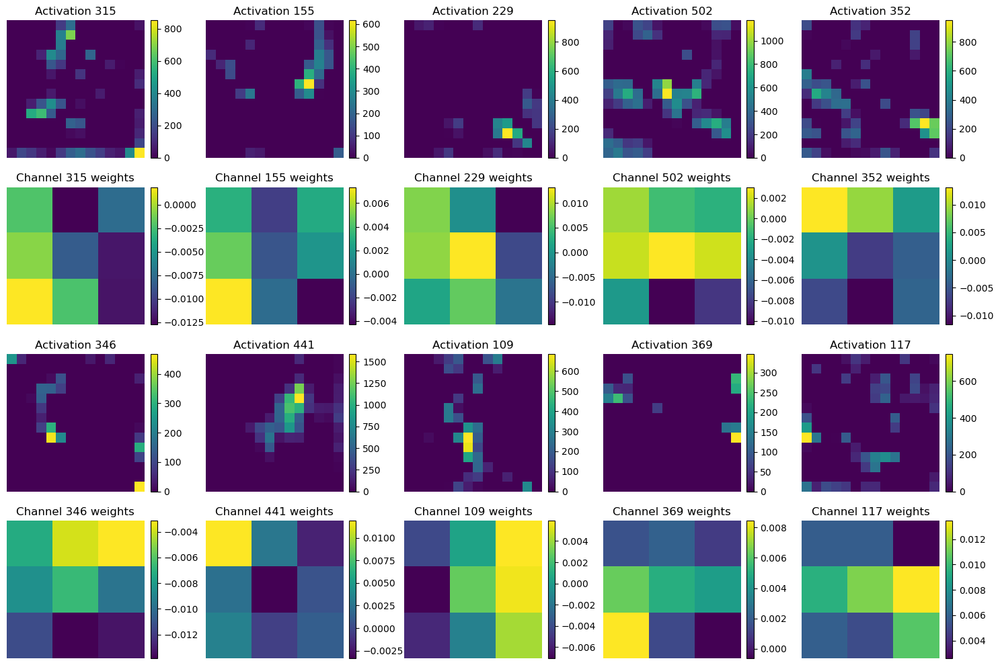

Image 16: 


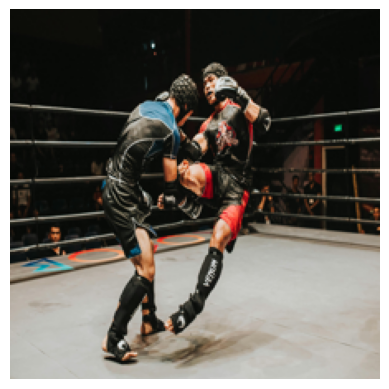

1/1 [==============================] - 0s 194ms/step


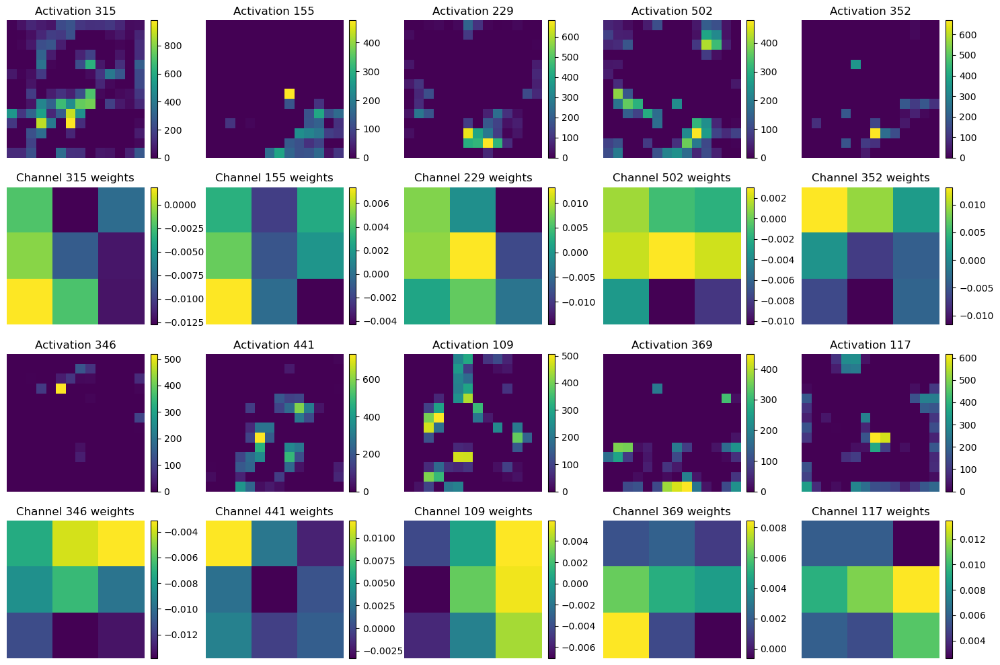

In [52]:
# Path to the folder containing images
folder_path = r'C:\Users\varun\OneDrive\Desktop\Assignment\8321\Lab 3\images'

# Iterate over the images in the folder
for i, filename in enumerate(os.listdir(folder_path), start=1):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        print(f"Image {i}: ")
        
        img_path = os.path.join(folder_path, filename)
        activations = get_block5_conv1_activations(img_path)
        
        # Target filter indices 
        target_filter_indices = [315, 155, 229, 502, 352, 346, 441, 109, 369, 117]
        
        # Visualize activations and channel weights
        visualize_activations_and_weights(activations, target_filter_indices)

In the above visualization of activations and the filter channel, yellow/bright color is to denote high excitation. We see how these 10 channels activate different parts of the test images, that we passed through these top 10 most influential filters. 

The purpose of running a few test images is to visualize what part of the image is excited by the top channels in this selected filter. I purposely ran images containing human faces, so that we can verify that the filter 457 that I selected is responsible for detecting this meaningful feature. If we can verify that the top filters do indeed get excited by concave shapes in the input image, like that of a person's lips or eyes, then we can confidently say that this filter really does detect meaningful features and that my initial hypothesis does hold true.

#### For each of the ten chosen single channels of the filter, use image gradient techniques to visualize what each of these filters is most excited by. 

Now, we have the top 10 channels of the selected filter 457 from Block5_Conv1 layer. And similar to the first step, we use gradient ascent to create an image that maximally excites the filter. But this time we use only a single channel at a time, instead of using the whole filter. 

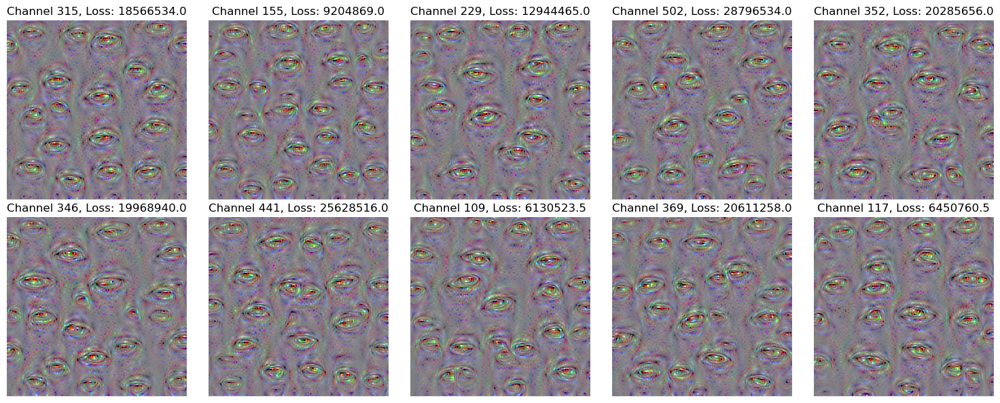

In [42]:
import tensorflow as tf
from tensorflow.keras import models
import numpy as np
import matplotlib.pyplot as plt

# Define a function to compute the loss
def compute_loss(input_image, target_filter_idx):
    activation = new_model(input_image)
    return tf.reduce_mean(activation[:, :, :, target_filter_idx])

# Define a function to perform gradient ascent
@tf.function
def gradient_ascent_step(input_image, target_filter_idx, learning_rate=0.01):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        loss = compute_loss(input_image, target_filter_idx)
    grads = tape.gradient(loss, input_image)
    grads /= tf.maximum(tf.math.reduce_std(grads), 1e-8)
    input_image += learning_rate * grads
    return input_image, loss

# Selecting a layer and channel to visualize
layer_name = 'block5_conv1'
filter_index = 457

# Isolate the output of interest and create a new model
layer_output = model.get_layer(layer_name).output
new_model = models.Model(inputs=model.input, outputs=layer_output)

# Initialize input images
input_images = []
for _ in range(10):
    input_images.append(tf.random.uniform((1, 224, 224, 3)))

top_indices = [315, 155, 229, 502, 352, 346, 441, 109, 369, 117]

# Run gradient ascent for each filter channel
iterations = 200
num_rows = (len(input_images) + 4) // 5  # Calculate the number of rows needed, rounding up
fig, axes = plt.subplots(num_rows, 5, figsize=(15, num_rows * 3))

for i, input_image in enumerate(input_images):
    target_filter_idx = top_indices[i]
    for _ in range(iterations):
        input_image, loss = gradient_ascent_step(input_image, filter_index, target_filter_idx)

    # Normalize the generated image for visualization
    generated_image = input_image.numpy().squeeze()
    generated_image -= generated_image.mean()
    generated_image /= generated_image.std() + 1e-5
    generated_image *= 0.1
    generated_image += 0.5
    generated_image = np.clip(generated_image, 0, 1)

    # Display the generated image
    row = i // 5  # Calculate the row index
    col = i % 5   # Calculate the column index
    axes[row, col].imshow(generated_image, cmap='viridis')
    axes[row, col].set_title(f"Channel {target_filter_idx}, Loss: {loss.numpy()}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


The top indices are [315, 155, 229, 502, 352, 346, 441, 109, 369, 117]. In the above output images which maximally excites the 10 filters that we had identified earlier. All of these channels produce images which does verify that Filter 457 in Block5_Conv1 is indeed a Polysemantic node in the VGG19 convolutional neural network. 

# Conclusion

After analysing this particular filter 457, found in the downstream layer Block5_Conv1 of the VGG19 model, I can confidently say that this is polysemantic node. As part of the circuit this filter ,and its channels, focus on concave shapes like that of eyes. 

We have seen this in the first step of this assignment when we created an image which maximally excited the filter. We obtained many concave shapes resembling eyes or lips. 

Then later on, we passed some images from each class of ImageNet. Again we saw the top class that excited this particular filter had many concave shapes, images contained camera lens cover, human faces, dog, etc. Even the images of class sunscreen had many concave shapes, which I believe triggered the filter.  

Now, I picked the top 10 most influential channels from the filter 457 based on the L2 normalization, out of a total 512 channels. I used only a single channel at a time and passed some test images through them. By passing images through these channels individually, I wanted to test what parts of a picture does the channel excite and if there is major differences between the output activation of these channels for a single image. 

And finally, I used individual channels to create 10 images that maximally excite them. Again, the output revealed concave shape like that of an eye or lips. 

By gathering all this evidence I believe my hypothesis has been proved correct. This is truly a polysemantic filter, unaffected by pose variance. We verified this by using different kinds of images, with different orientations, of people, animals, balls, etc. 

The activation from these diverse set of input images, all of them revealed excitation in an area of the image where we see a concave shape. Like we see it in images containing human faces, lens cover, tennis racket, only eyes, etc. By testing the output activations and by using gradient ascent to generate images, we verify that the filter 457 is utilized by VGG19 model, to detect a universal feature, the concave shape.



# References <br>
1. https://viso.ai/deep-learning/vgg-very-deep-convolutional-networks/<br>
2. https://microscope.openai.com/models/vgg19_caffe/conv5_1_conv5_1_0?models.op.feature_vis.type=channel&models.op.technique=feature_vis<br>
3. https://www.pexels.com/<br>
4. https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb
5. https://distill.pub/2020/circuits/zoom-in/
6. https://storage.googleapis.com/distill-circuits/inceptionv1-weight-explorer/mixed3b_379.html

I used instructors code and also used chat-gpt to generate code for different parts of this assignment. 
